📈 Stock Market Visibility Graph Analyzer
Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241024 entries, 0 to 241023
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      241024 non-null  int64  
 1   symbol          241024 non-null  object 
 2   open            241024 non-null  float64
 3   high            241024 non-null  float64
 4   low             241024 non-null  float64
 5   close           241024 non-null  float64
 6   f_date          241024 non-null  object 
 7   percent_change  241024 non-null  float64
 8   volume          241024 non-null  int64  
 9   sector          241024 non-null  object 
dtypes: float64(5), int64(2), object(3)
memory usage: 18.4+ MB

Available stock symbols: ['ADBL' 'CZBIL' 'EBL' 'GBIME' 'HBL' 'KBL' 'LBL' 'MBL' 'NABIL' 'NBL' 'NICA'
 'NMB' 'PCBL' 'PRVU' 'SANIMA' 'SBI' 'SBL' 'SCB' 'SRBL' 'CORBL' 'EDBL'
 'GBBL' 'GRDBL' 'JBBL' 'KRBL' 'KSBBL' 'LBBL' 'MD


Enter the company stock you would like to check:  PRIN
Enter the days you would like to calculate the moving average of:  30



With a window size of 30 days and 2834 data points,
the maximum number of visibility graphs that can be generated is: 2804

--------------------------------------------------
Select the field you would like to explore:
1. Close
2. Open
3. High
4. Avg
5. Volume
6. Low


Enter your choice (1-6):  3



--------------------------------------------------
Generating visibility graphs...


Generating visibility graphs: 100%|█████████████| 29/29 [00:04<00:00,  6.91it/s]



You can visualize up to 2804 visibility graphs.


Enter the number of visibility graph samples you would like to observe (1-2804):  50


Graph dataset saved to graph_dataset_class_labeled.pkl

--------------------------------------------------
Displaying sample visibility graphs...


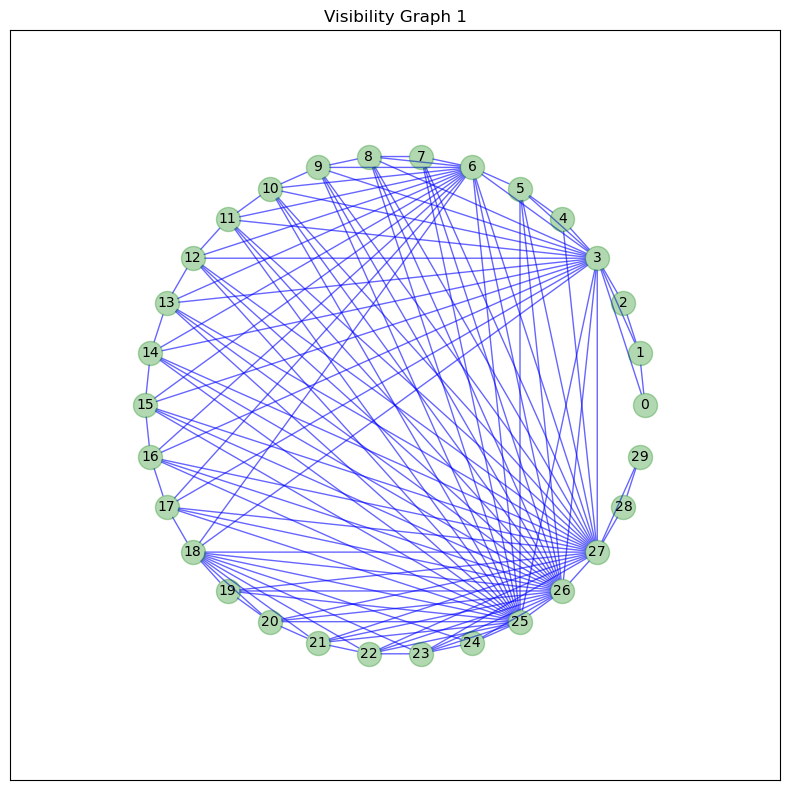

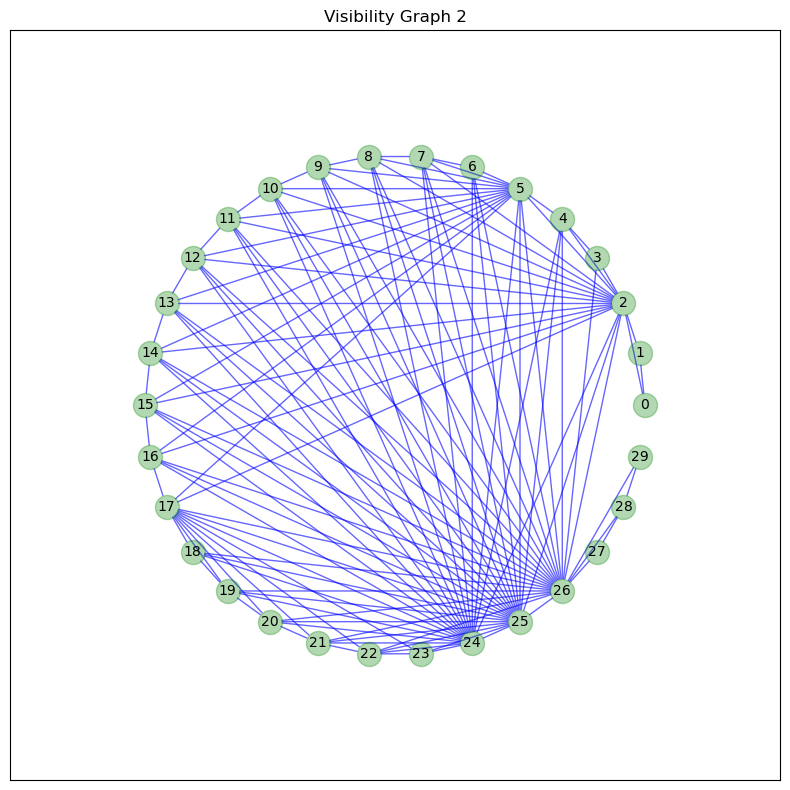

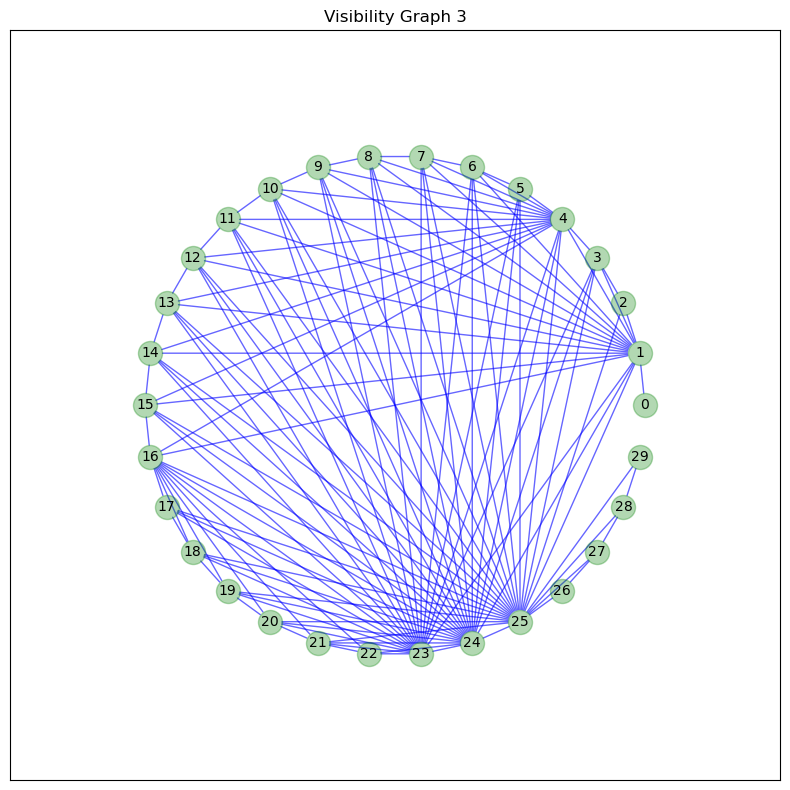

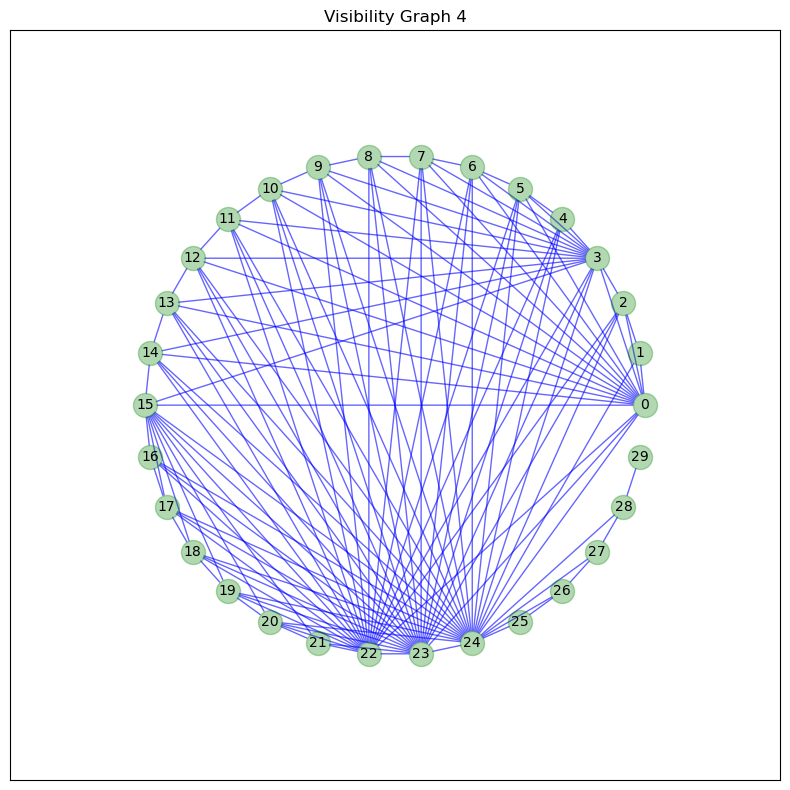

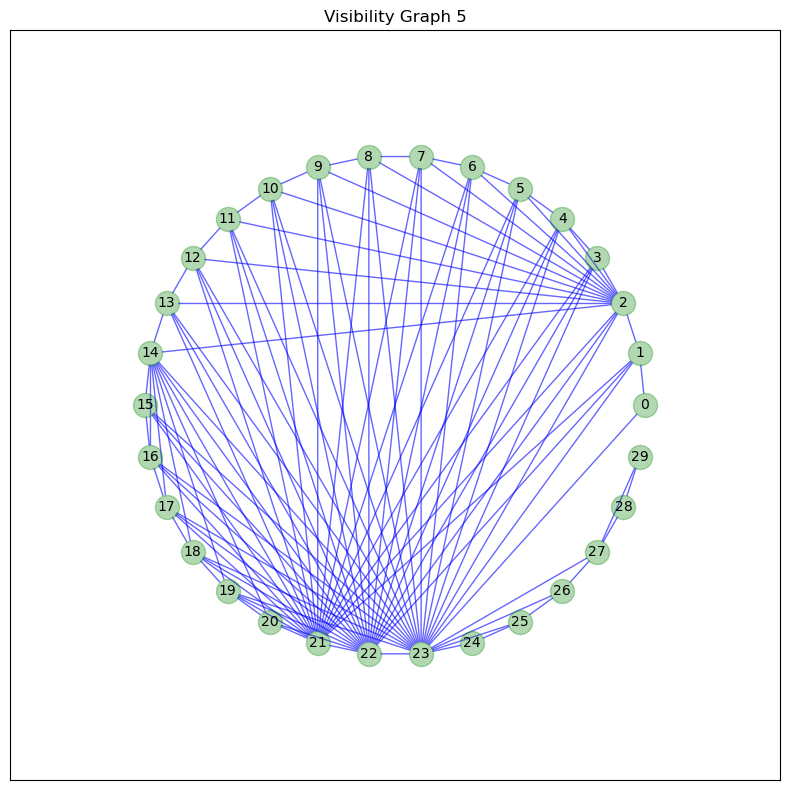

...

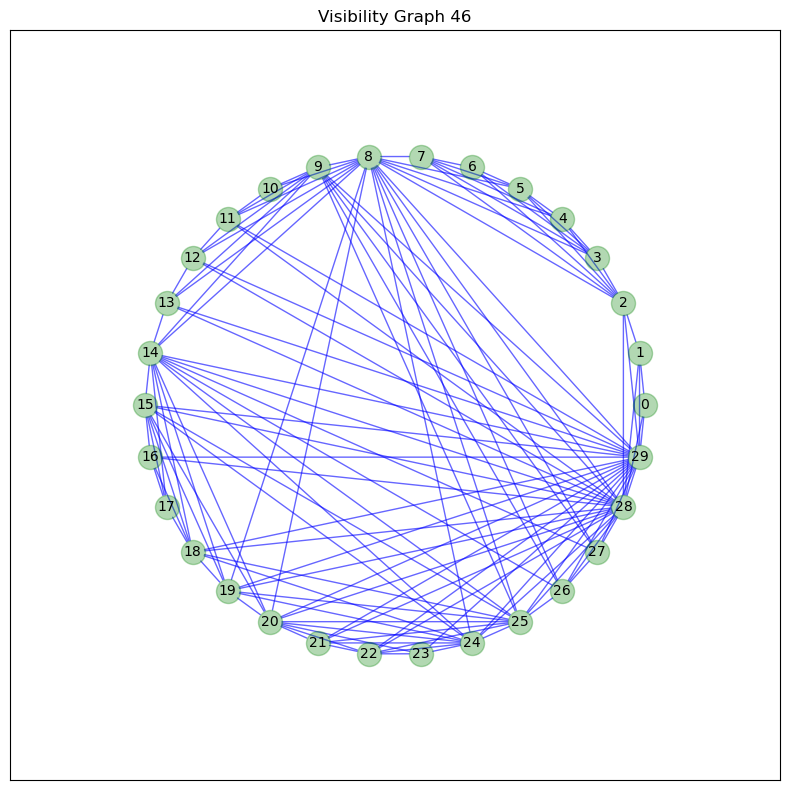

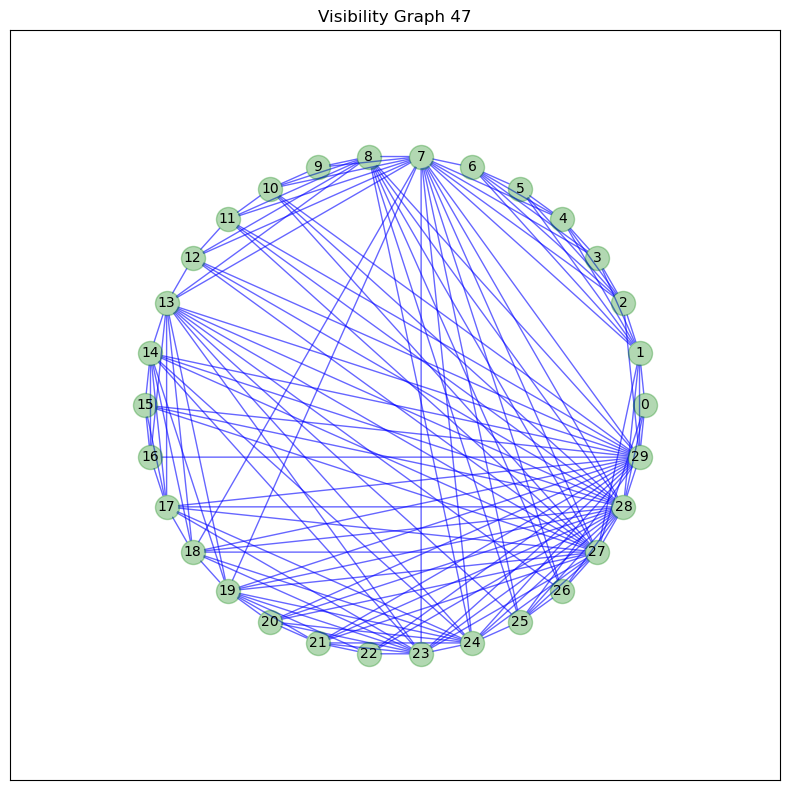

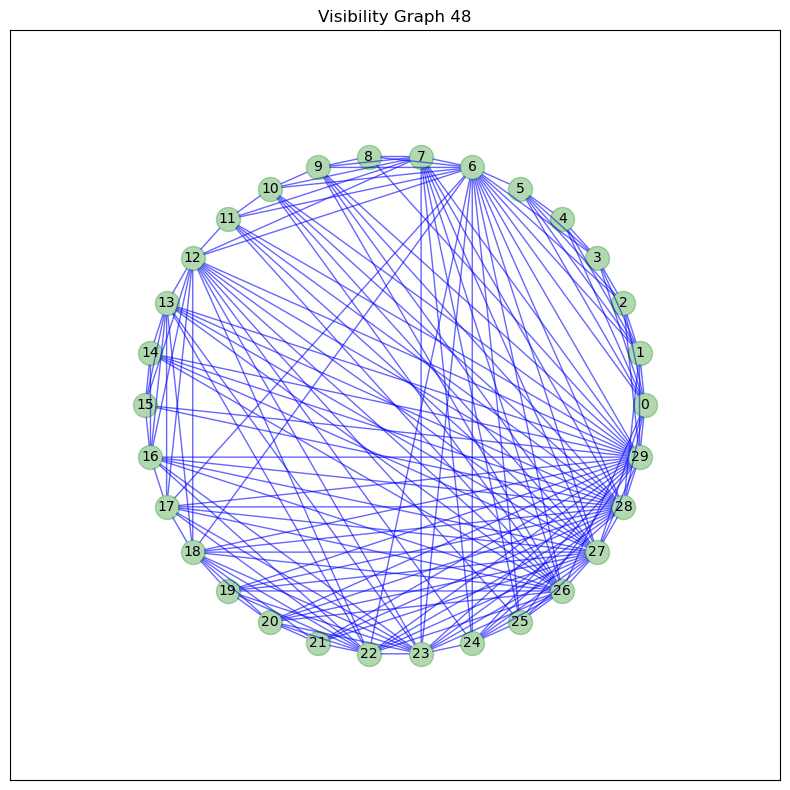

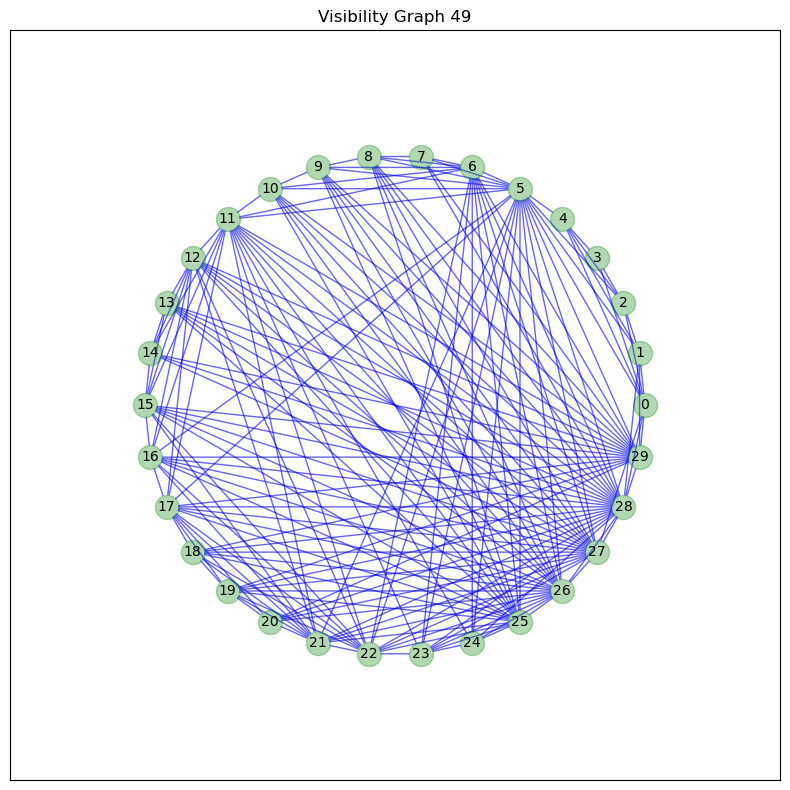

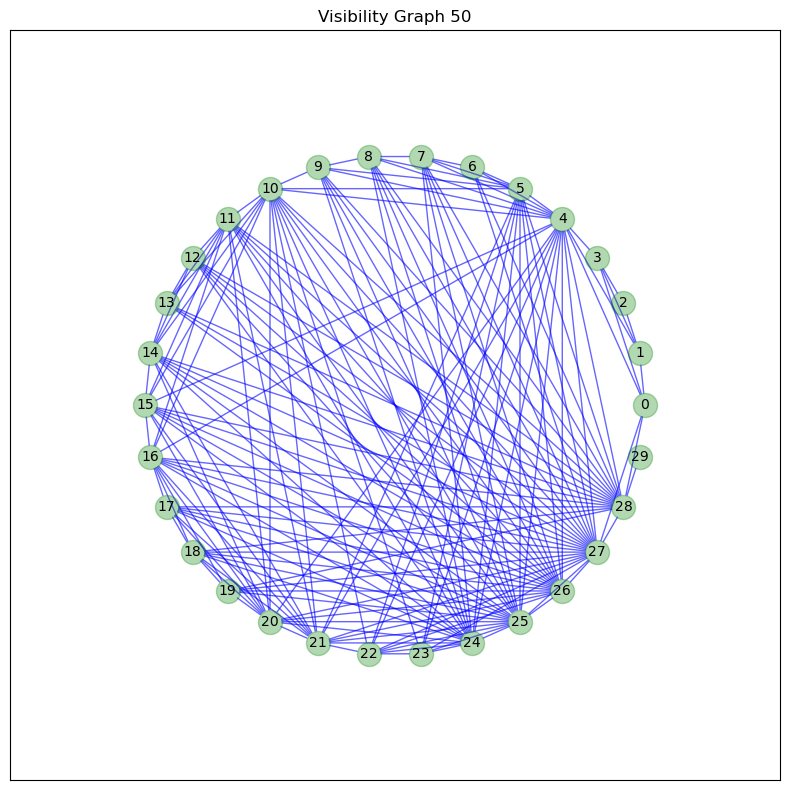


--------------------------------------------------
Analyzing feature distributions...


Extracting graph features: 100%|███████████| 2804/2804 [00:19<00:00, 140.66it/s]


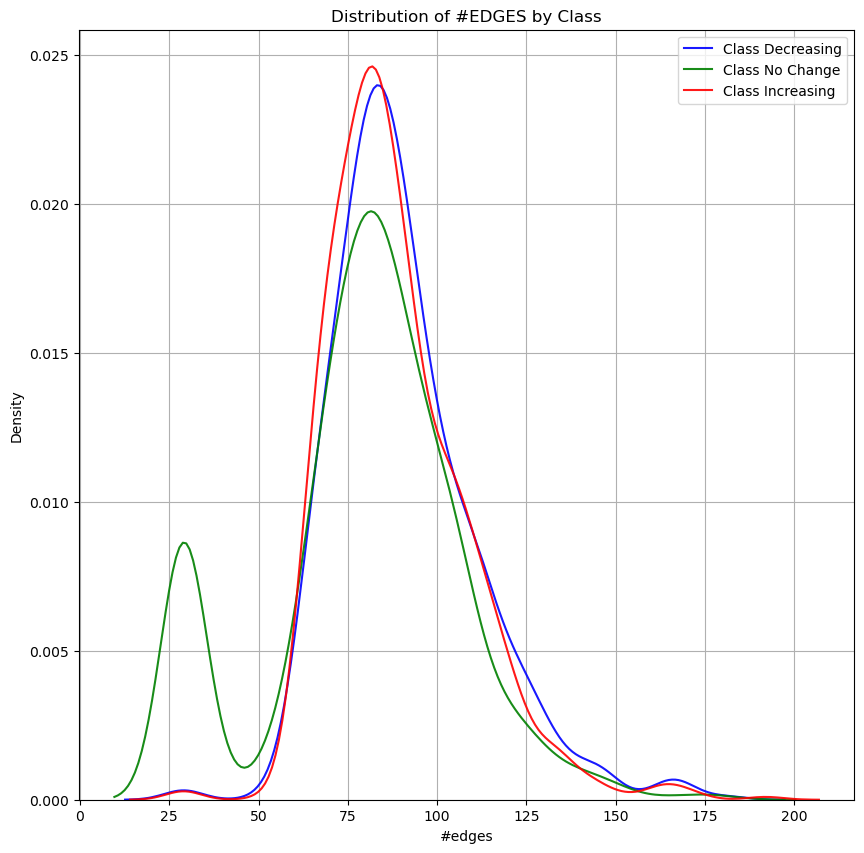

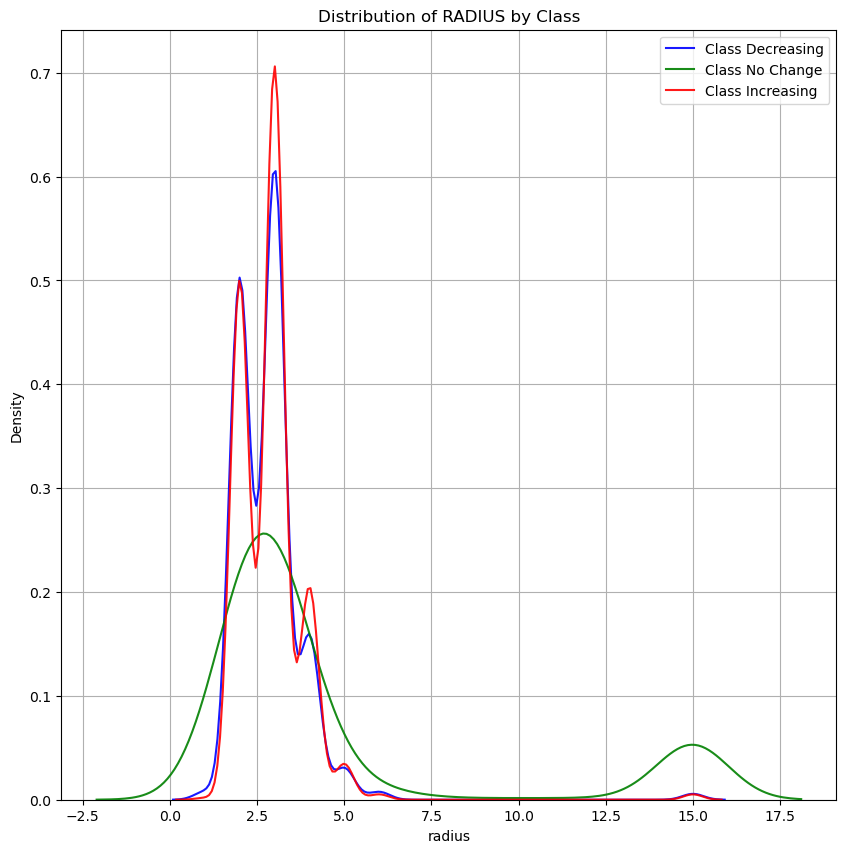

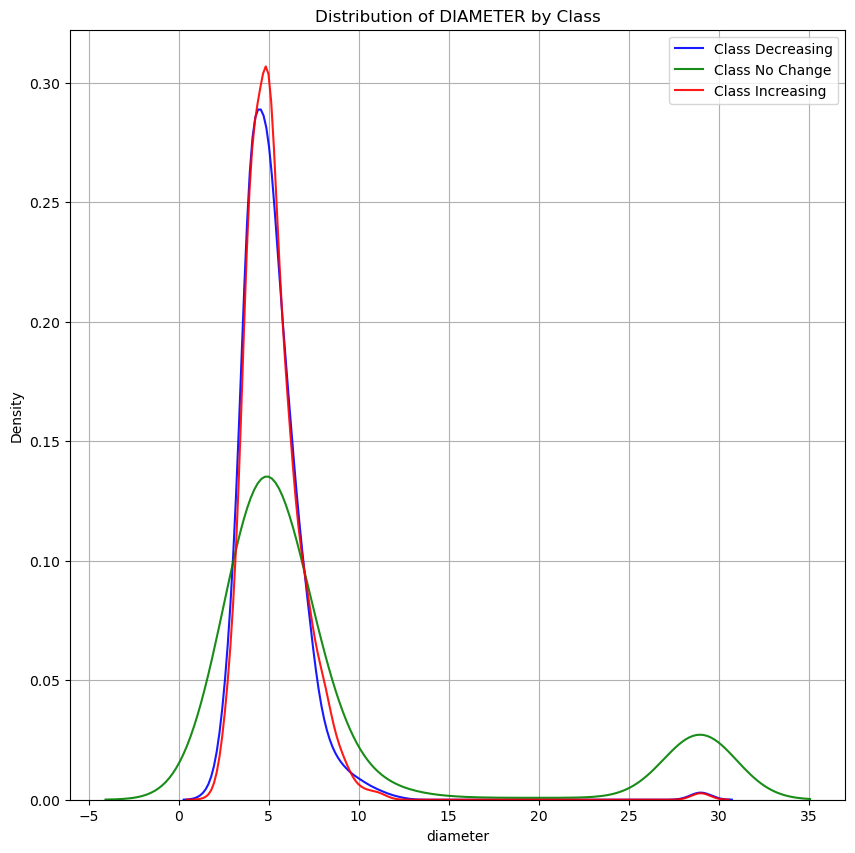

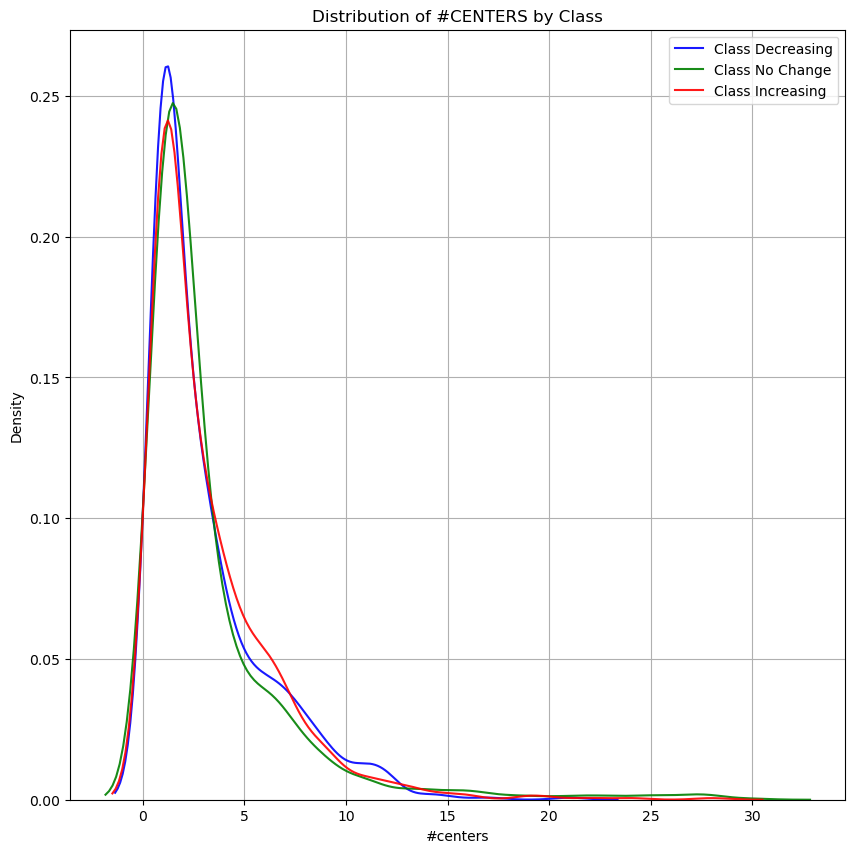

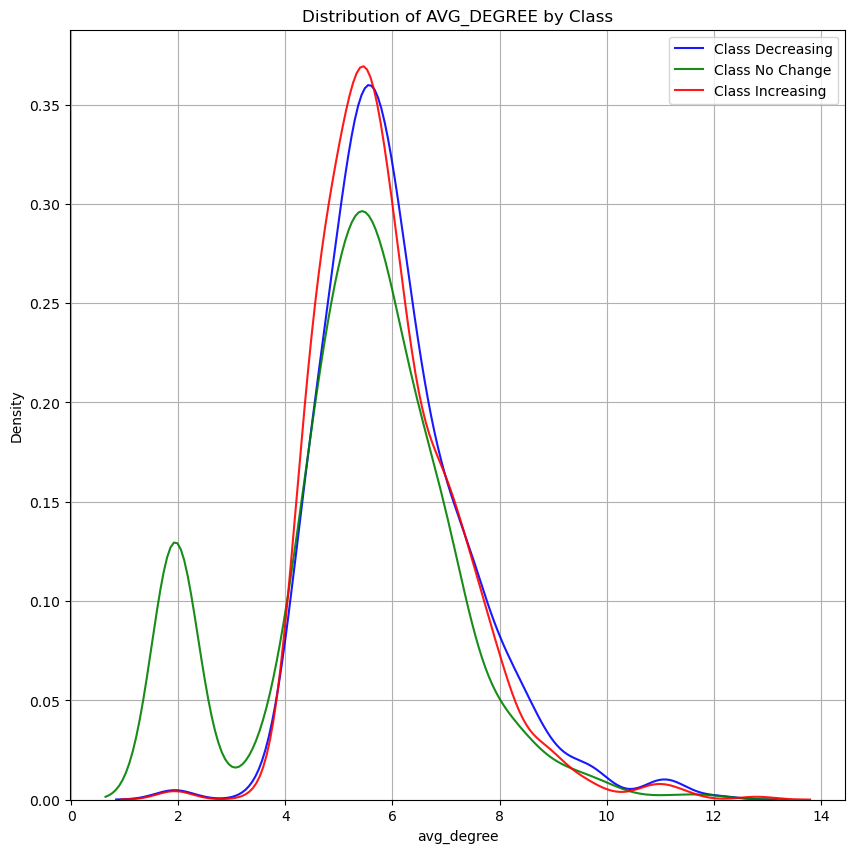

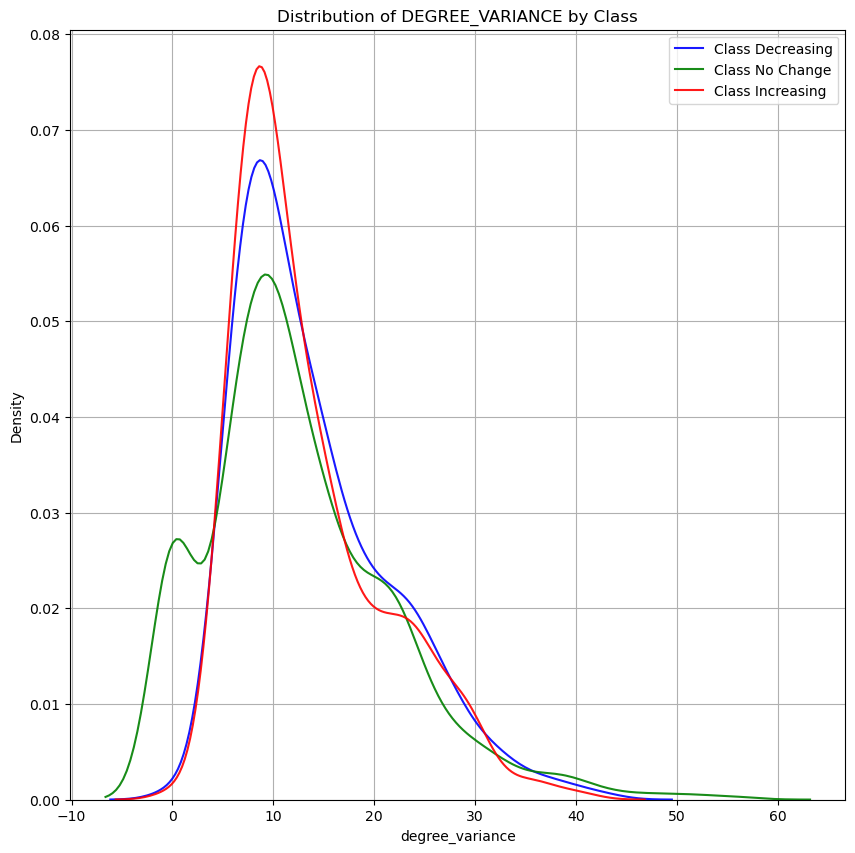

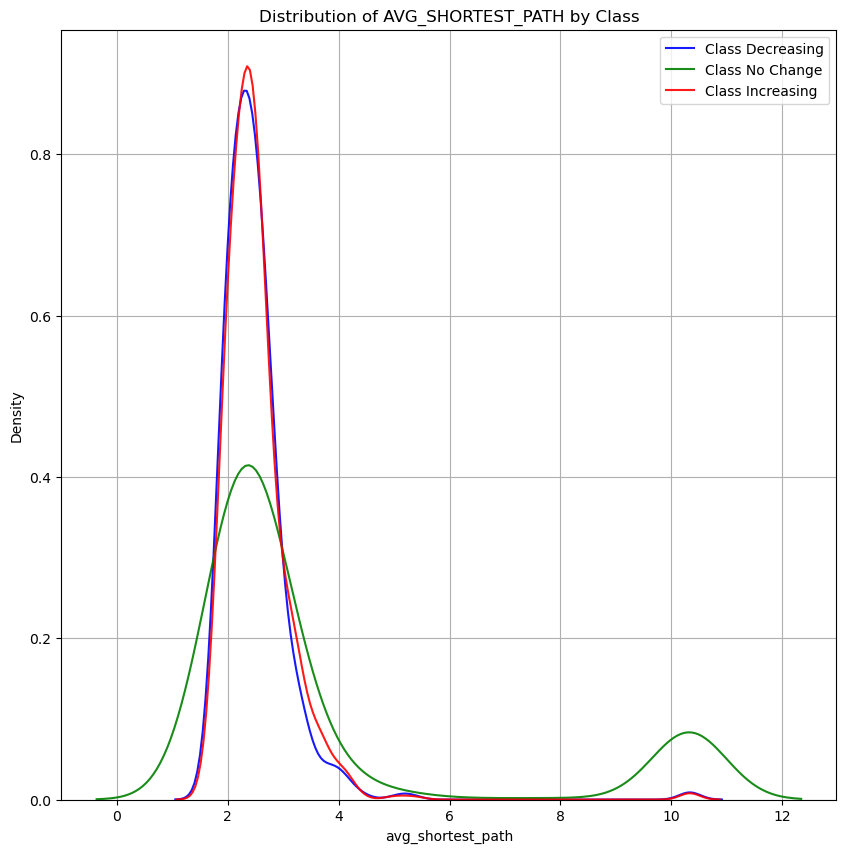

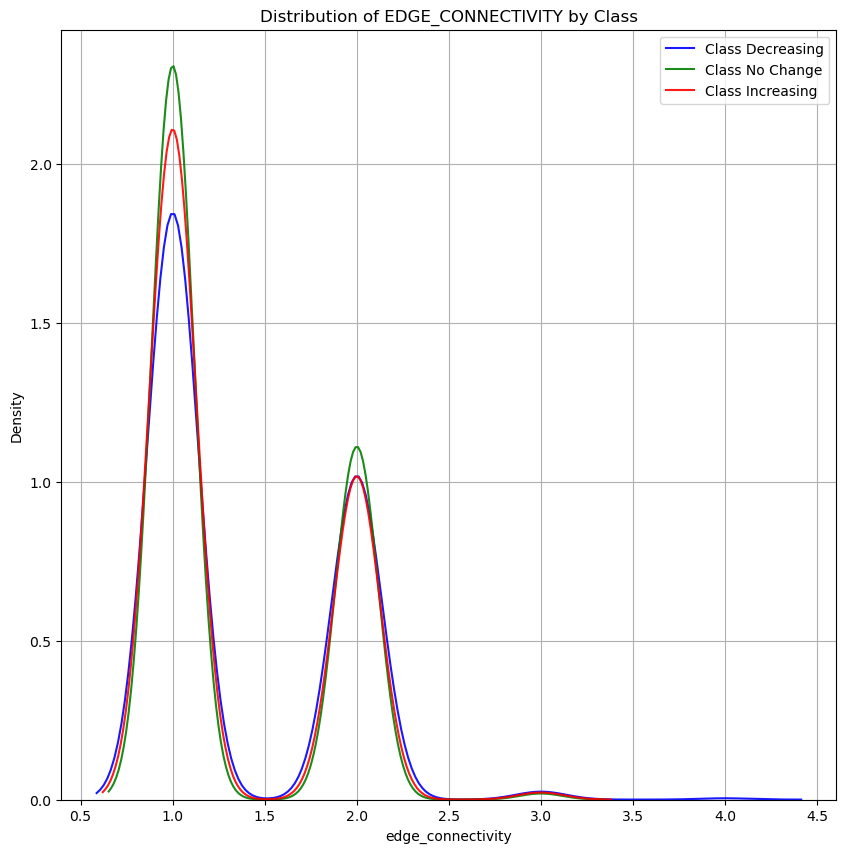

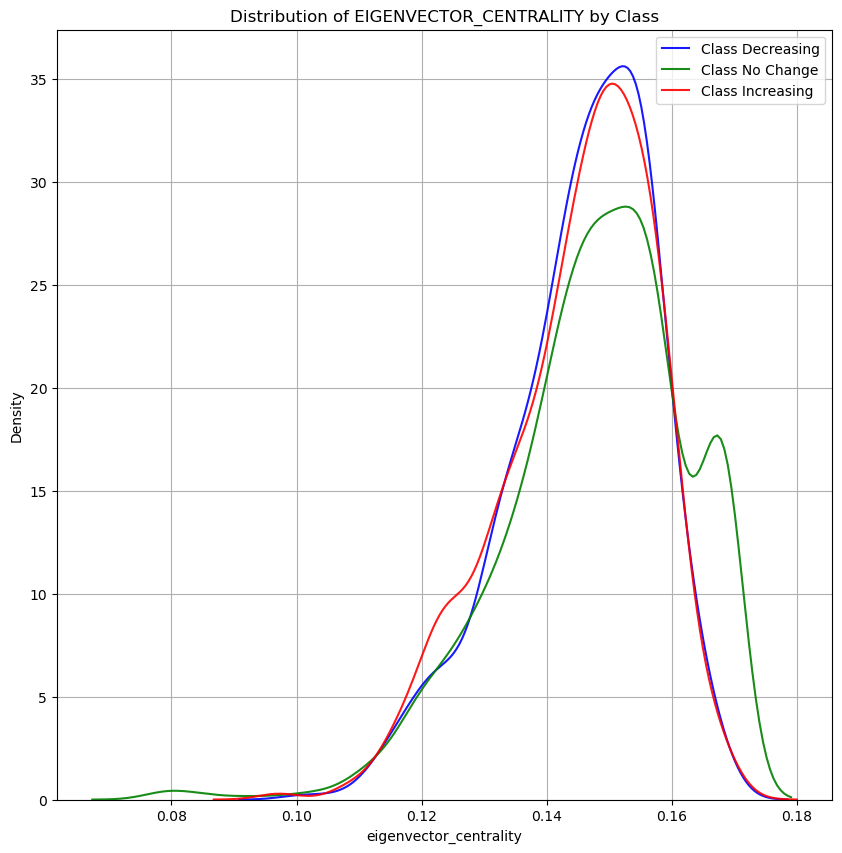

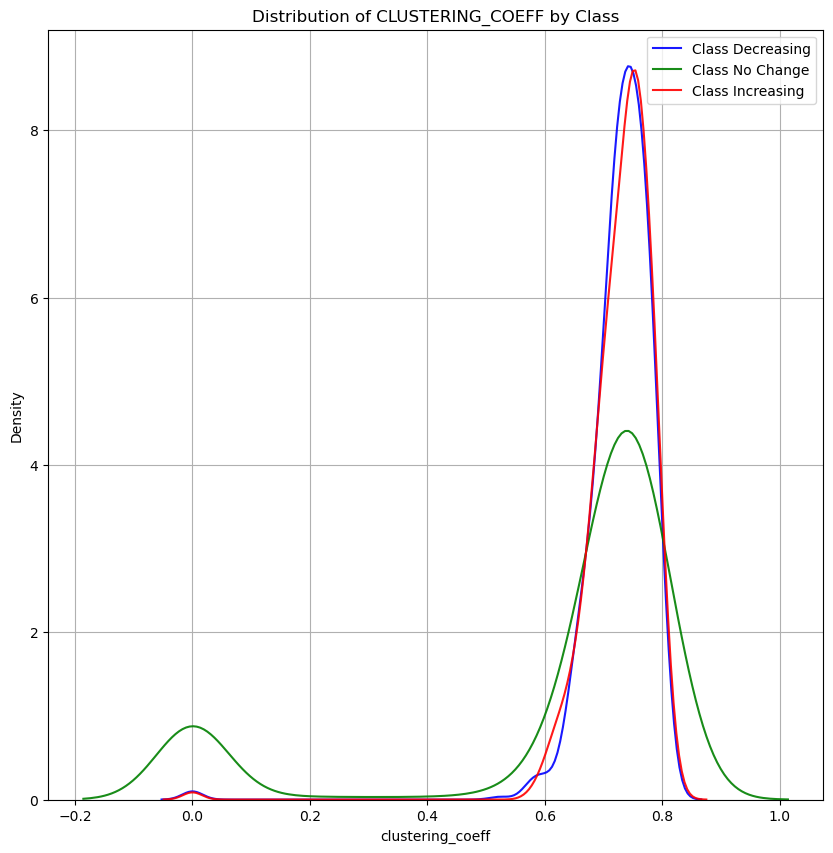

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import pickle
import seaborn as sns
from tqdm import tqdm


class StockVisibilityAnalyzer:
    """
    A class to analyze stock fluctuations using visibility graphs.

    Attributes:
        clean_data (pd.DataFrame): Cleaned and preprocessed stock data.
        window_size (int): Size of the sliding window for feature extraction.
        features_data (pd.DataFrame): Extracted features using sliding windows.
        visibility_graphs (list): List of visibility graphs generated from the data.
        graph_dataset (list): List of tuples containing graphs and their corresponding labels.
        labeled_data (pd.DataFrame): Data labeled with trends (Increasing, Decreasing, No Change).
        column_prefix (str): Prefix for column names in the feature dataset.
        max_possible_graphs (int): Maximum number of visibility graphs that can be generated.
    """

    def __init__(self):
        """Initialize the StockVisibilityAnalyzer with default attributes."""
        self.clean_data = None
        self.window_size = None
        self.features_data = None
        self.visibility_graphs = None
        self.graph_dataset = None
        self.labeled_data = None
        self.column_prefix = None
        self.max_possible_graphs = None

    def load_and_clean_data(self, file_path):
        """
        Load and clean the stock data from a CSV file.

        Args:
            file_path (str): Path to the CSV file containing stock data.

        Returns:
            pd.DataFrame: Cleaned and preprocessed stock data.
        """
        self.clean_data = pd.read_csv(file_path)

        # Print dataset information
        print("Dataset Info:")
        self.clean_data.info()

        # Display available stock symbols
        available_symbols = self.clean_data['symbol'].unique()
        print(f"\nAvailable stock symbols: {available_symbols}")

        # Prompt user to select a stock symbol
        user_choice1 = input("\nEnter the company stock you would like to check: ")
        while user_choice1 not in available_symbols:
            print("Invalid choice. Please select a valid stock symbol.")
            user_choice1 = input("Enter the company stock you would like to check: ")

        # Filter data for the selected stock and prepare time series
        self.clean_data = self.clean_data[self.clean_data['symbol'] == user_choice1]
        self.clean_data = self.clean_data.drop_duplicates(subset='f_date')
        self.clean_data['f_date'] = pd.to_datetime(self.clean_data['f_date'], errors='coerce')
        self.clean_data = self.clean_data.dropna(subset=['f_date'])

        # Fix missing dates by setting date as index and forward-filling
        self.clean_data = self.clean_data.set_index('f_date')
        all_dates = pd.date_range(start=self.clean_data.index.min(), end=self.clean_data.index.max(), freq='D')
        self.clean_data = self.clean_data.reindex(all_dates).ffill()

        # Remove unnecessary columns and calculate average price
        self.clean_data = self.clean_data.drop(["Unnamed: 0", "sector", "percent_change"], axis=1)
        self.clean_data['avg'] = self.clean_data[['open', 'high', 'low', 'close']].mean(axis=1)

        # Reset index for further processing
        self.clean_data.reset_index(inplace=True)
        self.clean_data.rename(columns={'index': 'f_date'}, inplace=True)

        return self.clean_data

    def create_sliding_window_features(self, window_size):
        """
        Create sliding window features from the cleaned stock data.

        Args:
            window_size (int): Size of the sliding window.

        Returns:
            pd.DataFrame: DataFrame containing sliding window features.
        """
        self.window_size = window_size

        # Calculate the maximum number of visibility graphs that can be generated
        self.max_possible_graphs = len(self.clean_data) - window_size
        print(f"\nWith a window size of {window_size} days and {len(self.clean_data)} data points,")
        print(f"the maximum number of visibility graphs that can be generated is: {self.max_possible_graphs}")

        # Pre-allocate numpy array for better performance
        columns = ['avg', 'volume', 'open', 'high', 'low', 'close']
        rows_count = self.max_possible_graphs
        feature_array = np.zeros((rows_count, len(columns) * window_size))

        # Extract data once for all columns
        column_data = {col: self.clean_data[col].values for col in columns}

        # Fill the feature array efficiently
        for i in range(rows_count):
            col_idx = 0
            for col in columns:
                feature_array[i, col_idx:col_idx + window_size] = column_data[col][i:i+window_size]
                col_idx += window_size

        # Create column names
        column_names = []
        for col in columns:
            column_names.extend([f'{col}_{i+1}' for i in range(window_size)])

        self.features_data = pd.DataFrame(feature_array, columns=column_names)
        return self.features_data

    def generate_visibility_graphs(self, column_prefix, batch_size=100):
        """
        Generate visibility graphs from the sliding window features.

        Args:
            column_prefix (str): Prefix for column names in the feature dataset.
            batch_size (int): Number of graphs to process in each batch.

        Returns:
            list: List of visibility graphs.
        """
        self.column_prefix = column_prefix
        column_names = [f'{column_prefix}_{i+1}' for i in range(self.window_size)]

        # Process in batches to reduce memory pressure
        self.visibility_graphs = []
        num_batches = (len(self.features_data) + batch_size - 1) // batch_size

        for batch_idx in tqdm(range(num_batches), desc="Generating visibility graphs"):
            start_idx = batch_idx * batch_size
            end_idx = min((batch_idx + 1) * batch_size, len(self.features_data))

            batch_values = self.features_data.iloc[start_idx:end_idx][column_names].values
            batch_graphs = [self._create_visibility_graph(row) for row in batch_values]
            self.visibility_graphs.extend(batch_graphs)

        return self.visibility_graphs

    def _create_visibility_graph(self, values):
        """
        Helper method to create a visibility graph from a row of values.

        Args:
            values (np.array): Array of values to create the visibility graph.

        Returns:
            nx.Graph: Visibility graph.
        """
        try:
            return nx.visibility_graph(values)
        except Exception as e:
            print(f"Error creating visibility graph: {e}")
            # Return empty graph as fallback
            G = nx.Graph()
            for i in range(len(values)):
                G.add_node(i)
            return G

    def label_dataset(self):
        """
        Label the dataset with trends (Increasing, Decreasing, No Change).

        Returns:
            pd.DataFrame: Labeled dataset.
        """
        column_names = [f'{self.column_prefix}_{i+1}' for i in range(self.window_size)]
        self.labeled_data = self.features_data[column_names].copy()

        # Pre-allocate class array
        class_array = np.zeros(len(self.labeled_data), dtype=int)

        # Get last column values for comparison
        last_col_values = self.labeled_data[column_names[-1]].values

        # Vectorized operations for trend classification
        for i in range(len(self.labeled_data) - 1):
            current_val = last_col_values[i]
            next_val = last_col_values[i + 1]

            if next_val > current_val:
                class_array[i] = 0  # Decreasing
            elif next_val == current_val:
                class_array[i] = 1  # No Change
            else:
                class_array[i] = 2  # Increasing

        # Convert numerical classes to labels
        self.labeled_data['class'] = class_array
        self.labeled_data['class'] = self.labeled_data['class'].map(
            {0: "Decreasing", 1: "No Change", 2: "Increasing"}
        )

        # Associate graphs with classes
        self.graph_dataset = list(zip(self.visibility_graphs, self.labeled_data['class']))

        return self.labeled_data

    def save_graph_dataset(self, filename='graph_dataset_class_labeled.pkl'):
        """
        Save the graph dataset to a pickle file.

        Args:
            filename (str): Name of the file to save the dataset.
        """
        with open(filename, 'wb') as f:
            pickle.dump(self.graph_dataset, f)
        print(f"Graph dataset saved to {filename}")

    def extract_graph_features(self):
        """
        Extract features from the visibility graphs.

        Returns:
            pd.DataFrame: DataFrame containing graph features and their corresponding labels.
        """
        features = []

        for graph, _ in tqdm(self.graph_dataset, desc="Extracting graph features"):
            nodes = graph.number_of_nodes()
            edges = graph.number_of_edges()

            # Initialize default values
            edge_connectivity = 0
            eigenvector_centrality = 0
            clustering_coeff = 0
            diameter = 0
            radius = 0
            avg_degree = 0
            degree_variance = 0
            avg_shortest_path = 0
            num_centers = 0

            try:
                if nodes > 0 and edges > 0:
                    # Calculate graph metrics for connected graphs
                    if nx.is_connected(graph):
                        diameter = nx.diameter(graph)
                        radius = nx.radius(graph)
                        center = nx.center(graph)
                        num_centers = len(center)
                        avg_shortest_path = nx.average_shortest_path_length(graph)
                        edge_connectivity = nx.edge_connectivity(graph)

                    # Graph metrics that don't require connectedness
                    degrees = [deg for _, deg in graph.degree()]
                    avg_degree = np.mean(degrees) if degrees else 0
                    degree_variance = np.var(degrees) if degrees else 0
                    clustering_coeff = nx.average_clustering(graph)

                    # Calculate eigenvector centrality with error handling
                    try:
                        centrality_dict = nx.eigenvector_centrality(graph, max_iter=5000, tol=1e-4)
                        eigenvector_centrality = np.mean(list(centrality_dict.values()))
                    except (nx.PowerIterationFailedConvergence, ValueError):
                        eigenvector_centrality = 0

            except (nx.NetworkXError, nx.NetworkXPointlessConcept):
                pass  # Silently skip errors

            features.append({
                '#nodes': nodes,
                '#edges': edges,
                'diameter': diameter,
                'radius': radius,
                '#centers': num_centers,
                'avg_degree': avg_degree,
                'degree_variance': degree_variance,
                'avg_shortest_path': avg_shortest_path,
                'edge_connectivity': edge_connectivity,
                'eigenvector_centrality': eigenvector_centrality,
                'clustering_coeff': clustering_coeff
            })

        features_df = pd.DataFrame(features)
        features_df['class'] = self.labeled_data['class']
        return features_df


class Visualizer:
    """
    A class to visualize visibility graphs and feature distributions.
    """

    @staticmethod
    def plot_visibility_graphs(visibility_graphs, num_samples):
        """
        Plot a sample of visibility graphs.

        Args:
            visibility_graphs (list): List of visibility graphs.
            num_samples (int): Number of graphs to plot.
        """
        sampled_graphs = visibility_graphs[:num_samples]

        for i, G in enumerate(sampled_graphs):
            plt.figure(figsize=(8, 8))
            plt.margins(0.20)

            pos = nx.circular_layout(G)
            nx.draw_networkx_nodes(G, pos, alpha=0.3, node_size=300, node_color='green')
            nx.draw_networkx_labels(G, pos, font_size=10, font_color='black', font_weight='normal')
            nx.draw_networkx_edges(G, pos, alpha=0.6, width=1, edge_color='blue', style='solid',
                                  arrows=True, arrowstyle='-')

            plt.title(f"Visibility Graph {i+1}", fontsize=12)
            plt.axis("equal")
            plt.tight_layout()
            plt.show()
            plt.close()

    @staticmethod
    def plot_feature_distributions(features_df):
        """
        Plot feature distributions for each class.

        Args:
            features_df (pd.DataFrame): DataFrame containing graph features and their corresponding labels.
        """
        graph_features = [
            '#edges', 'radius', 'diameter', '#centers', 'avg_degree', 'degree_variance',
            'avg_shortest_path', 'edge_connectivity', 'eigenvector_centrality', 'clustering_coeff'
        ]

        class_colors = {
            "Decreasing": 'blue',
            "No Change": 'green',
            "Increasing": 'red'
        }

        for feature in graph_features:
            plt.figure(figsize=(10, 10))

            for class_label, color in class_colors.items():
                class_data = features_df[features_df['class'] == class_label]
                if len(class_data) > 0:
                    sns.kdeplot(class_data[feature],
                               label=f'Class {class_label}',
                               fill=False,
                               color=color,
                               alpha=0.9)

            if len(plt.gca().get_legend_handles_labels()[0]) > 0:
                plt.legend()

            plt.title(f'Distribution of {feature.upper()} by Class')
            plt.xlabel(feature.lower())
            plt.ylabel('Density')
            plt.grid(True)
            plt.show()


def get_valid_integer_input(prompt, min_value, max_value, error_message):
    """
    Helper function to get valid integer input from the user.

    Args:
        prompt (str): Prompt message for the user.
        min_value (int): Minimum allowed value.
        max_value (int): Maximum allowed value.
        error_message (str): Error message to display for invalid input.

    Returns:
        int: Valid integer input from the user.
    """
    while True:
        try:
            value = int(input(prompt))
            if min_value <= value <= max_value:
                return value
            print(error_message)
        except ValueError:
            print("Error: Please enter a valid integer.")


def main():
    """
    Main function to run the Stock Market Visibility Graph Analyzer.
    """
    print("=" * 50)
    print("📈 Stock Market Visibility Graph Analyzer")
    print("=" * 50)

    analyzer = StockVisibilityAnalyzer()
    analyzer.load_and_clean_data('data.csv')

    # Get valid moving average days
    data_length = len(analyzer.clean_data)
    window_size = get_valid_integer_input(
        "Enter the days you would like to calculate the moving average of: ",
        2, data_length,
        f"Error: Window size must be between 2 and {data_length} days."
    )
    analyzer.create_sliding_window_features(window_size)

    # Field selection
    print("\n" + "-" * 50)
    print("Select the field you would like to explore:")
    print("1. Close\n2. Open\n3. High\n4. Avg\n5. Volume\n6. Low")

    field_options = ['close', 'open', 'high', 'avg', 'volume', 'low']
    field_choice = get_valid_integer_input(
        "Enter your choice (1-6): ",
        1, 6,
        "Error: Please select a valid option (1-6)."
    )
    column_prefix = field_options[field_choice - 1]

    # Generate visibility graphs
    print("\n" + "-" * 50)
    print("Generating visibility graphs...")
    analyzer.generate_visibility_graphs(column_prefix)

    # Get valid number of samples based on maximum possible graphs
    max_samples = analyzer.max_possible_graphs
    print(f"\nYou can visualize up to {max_samples} visibility graphs.")
    num_samples = get_valid_integer_input(
        f"Enter the number of visibility graph samples you would like to observe (1-{max_samples}): ",
        1, max_samples,
        f"Error: Number of samples must be between 1 and {max_samples}."
    )

    # Label dataset and save
    analyzer.label_dataset()
    analyzer.save_graph_dataset()

    # Visualization
    print("\n" + "-" * 50)
    print("Displaying sample visibility graphs...")
    Visualizer.plot_visibility_graphs(analyzer.visibility_graphs, num_samples)

    # Statistical analysis
    print("\n" + "-" * 50)
    print("Analyzing feature distributions...")
    features_df = analyzer.extract_graph_features()
    Visualizer.plot_feature_distributions(features_df)


if __name__ == "__main__":
    main()